# **Neural Style Transfer With Tensorflow Tutorial**

Source for code: https://www.tensorflow.org/tutorials/generative/style_transfer

**Goal**: Created this notebook to explain in depth how to implement neural style transfer and how it works




---
**What is Neural Style Transfer?**

Neural Style Transfer is taking a content an image, this image of Michael Jordan from 1995, and a style image this famous Van Gogh painting “The Starry Night” and combining the two to produce an image that looks like the combination of the two


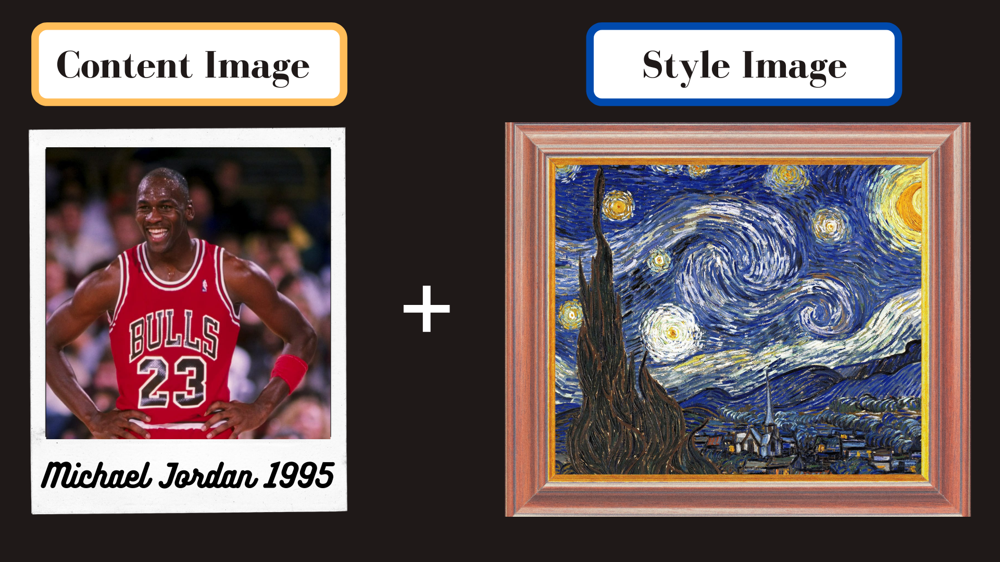





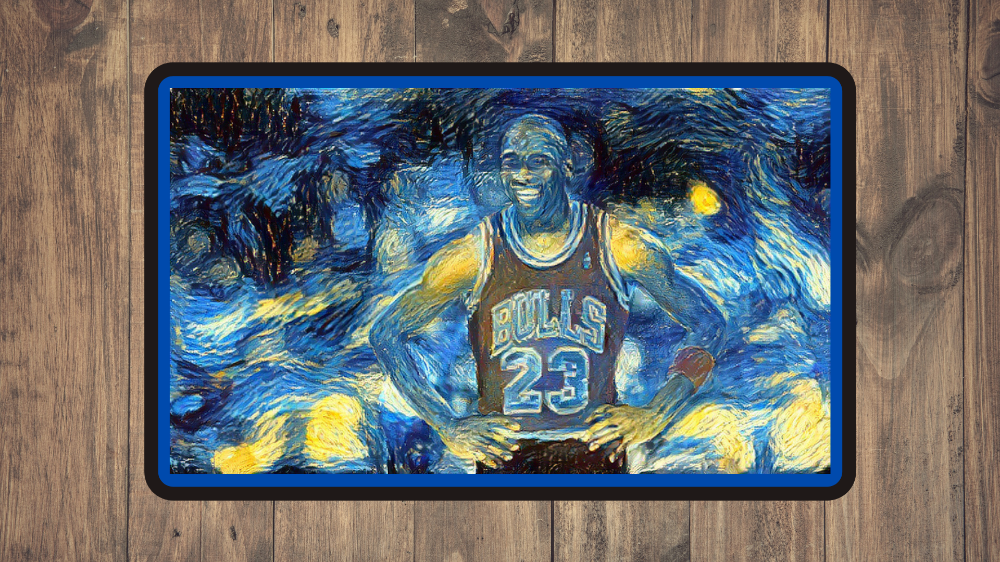

# **Importing Libraries for NST**

In [ ]:
import os
import tensorflow as tf


#Allows the user to import compressed versions of any tensorflow hub model that will be used in the code
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

#The following libraries below allow the user to display the images as they are being modified
import IPython.display as display
import matplotlib.pyplot as plt
import matplotlib as mpl



#Establishing the formatting of image outputs
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools



# **Image Preprocessing**

**What is a tensor & why is it important?**

As depicted below a tensor is an N-dimensional array of data, and in our case that data is an IMAGE, the dimensions of our images because of RGB is 3 by x  (width of image) by y (height of the image)

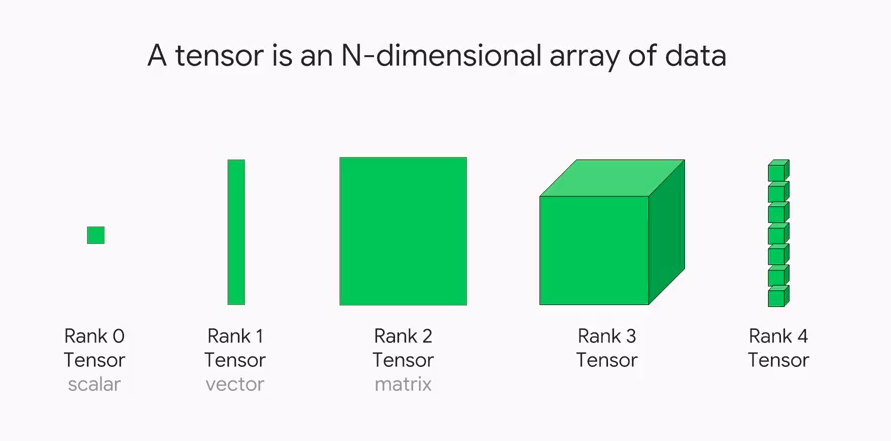


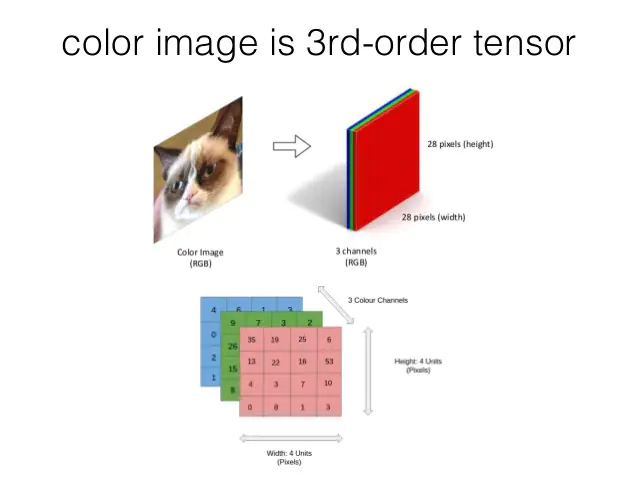

In [ ]:
#Converting the format that the model (Neural Network) uses to process images to a format that we can visualize
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [ ]:
#content image path & style image path
import cv2

content_path = '/content/benedict-cumberbatch-doctor-strange.jpg'
style_path = '/content/starry_night.jpg'

#this is to retrieve the images that we will be combining

# **Loading Our Images & Displaying Them**

In [ ]:
#This function is giving the user the ability to load images

def load_img(path_to_img): 
  # max dimension of the images that we are importing
  max_dim = 512


#Here we are loading our file, decoding it into a 3 dimensional tensor and converting it into a file based on format
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [ ]:
#Function to display the image
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

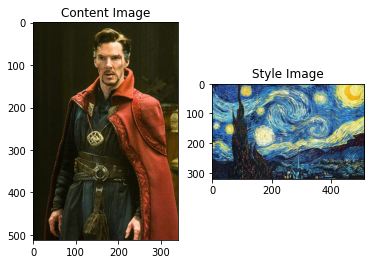

In [ ]:
#Loading in our content and style image and displaying them
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

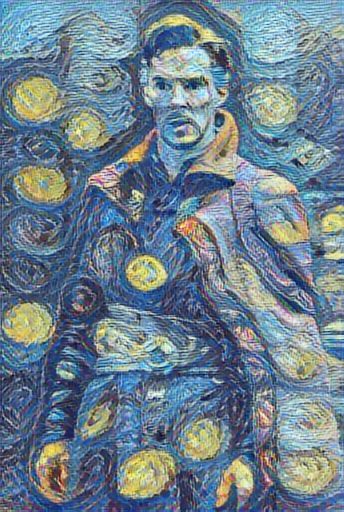

In [ ]:
#Using our model through tensorflow hub and instantiating our stylized image by using our model on the content and style image
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

# New Section

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

In [ ]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

In [ ]:
content_path = '/content/benedict-cumberbatch-doctor-strange.jpg'
content_image = load_img(content_path)

In [ ]:
!mkdir out

In [ ]:
from tqdm import tqdm
name_list = os.listdir('/content/style_images')
print(name_list)
load_folder='/content/style_images/'
for name in tqdm(name_list):
  load_path = os.path.join(load_folder, name)
  style_image = load_img(load_path)
  stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
  #tensor_to_image(stylized_image)
  op=tensor_to_image(stylized_image)
  op.save(os.path.join('/content/out/'+name))
  print(op)

['japanese_flower_sakai_hoitsu.jpg', 'picasso_selfport1907.jpg', 'water-lilies-1919-2.jpg', 'bamboo_forest.jpg', 'burnt_gold.jpg', 'the_scream.jpg', 'Blue Strokes.jpg', 'blue_swirls.jpg', 'escher_sphere.jpg', 'misty-mood-leonid-afremov.jpg', 'red-canna.jpg', 'woman-with-hat-matisse.jpg', 'starry_night.jpg', 'japanese_painting.jpg', 'wave_kanagawa.jpg', 'seated-nude.jpg', 'silver_plate.jpg', 'candy-style.jpg', 'shipwreck.jpg', 'frida_kahlo.jpg']


  5%|▌         | 1/20 [00:03<01:06,  3.52s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A1451CD0>


 10%|█         | 2/20 [00:07<01:05,  3.61s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A1348E50>


 15%|█▌        | 3/20 [00:10<01:01,  3.61s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A1451CD0>


 20%|██        | 4/20 [00:14<00:57,  3.57s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A1441190>


 25%|██▌       | 5/20 [00:18<00:54,  3.65s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE09D674210>


 30%|███       | 6/20 [00:21<00:51,  3.67s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A1415310>


 35%|███▌      | 7/20 [00:25<00:47,  3.65s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE09D6745D0>


 40%|████      | 8/20 [00:29<00:43,  3.65s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A1334ED0>


 45%|████▌     | 9/20 [00:32<00:40,  3.64s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE09D657890>


 50%|█████     | 10/20 [00:36<00:36,  3.61s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A143C4D0>


 55%|█████▌    | 11/20 [00:39<00:32,  3.63s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A1351810>


 60%|██████    | 12/20 [00:43<00:28,  3.62s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE09D060BD0>


 65%|██████▌   | 13/20 [00:47<00:25,  3.62s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE09D657C10>


 70%|███████   | 14/20 [00:50<00:21,  3.64s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A1350990>


 75%|███████▌  | 15/20 [00:54<00:18,  3.64s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A1334ED0>


 80%|████████  | 16/20 [00:58<00:14,  3.66s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE09D674450>


 85%|████████▌ | 17/20 [01:02<00:11,  3.71s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE09D657290>


 90%|█████████ | 18/20 [01:05<00:07,  3.73s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A1348E50>


 95%|█████████▌| 19/20 [01:09<00:03,  3.71s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A1348D50>


100%|██████████| 20/20 [01:13<00:00,  3.65s/it]

<PIL.Image.Image image mode=RGB size=344x512 at 0x7FE0A1428290>


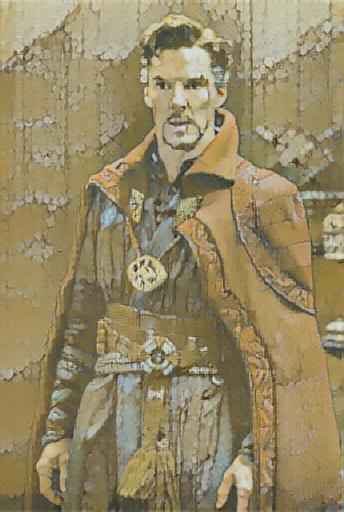

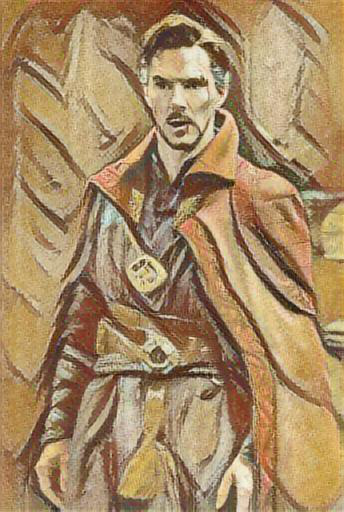

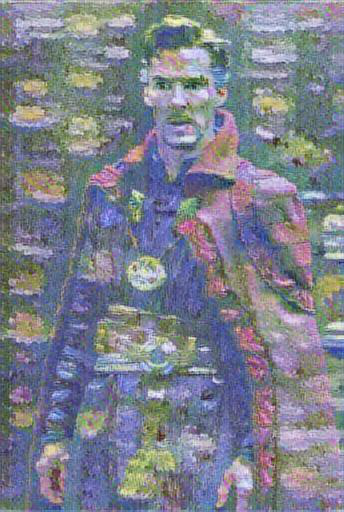

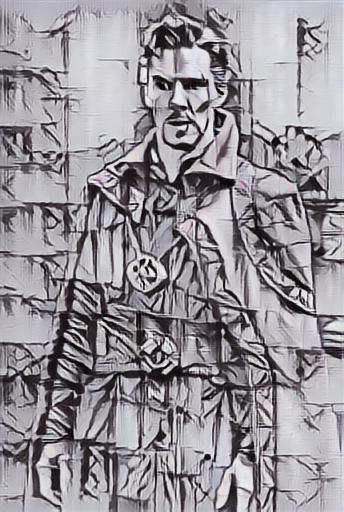

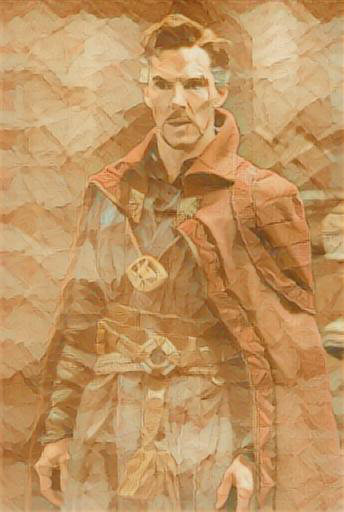

...

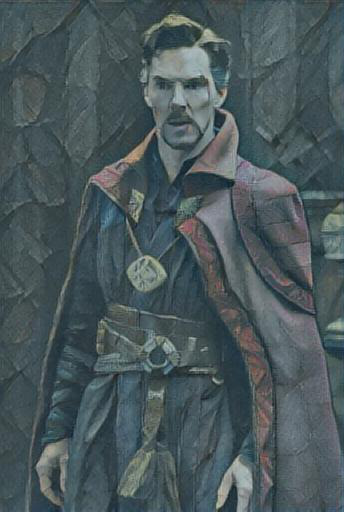

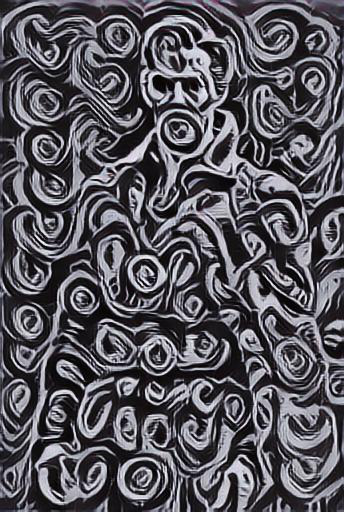

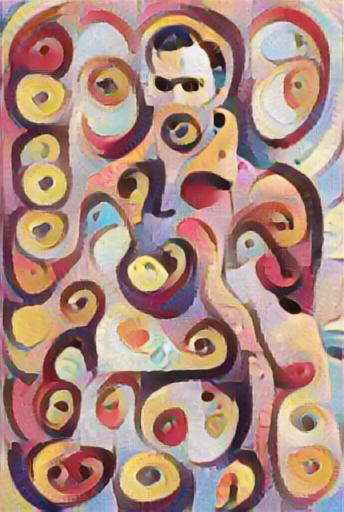

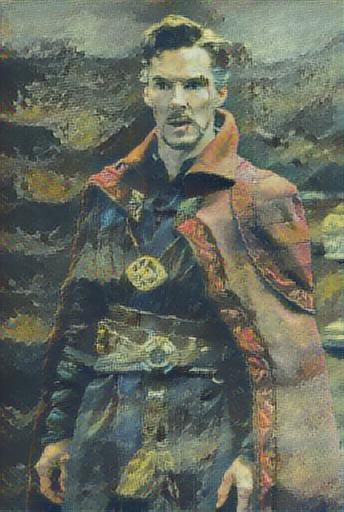

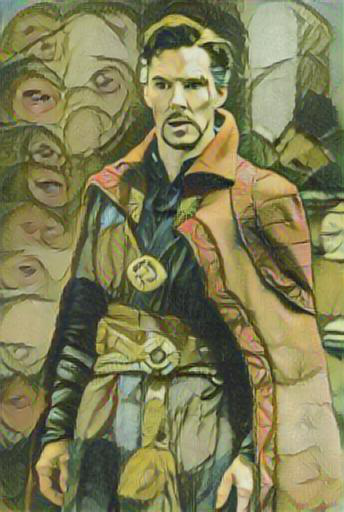

In [ ]:
name_list = os.listdir('/content/out')
load_folder='/content/out/'
for name in name_list:
  load_path = os.path.join(load_folder, name)
  image = io.imread(load_path) 
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
  cv2_imshow(image_2)
  print('\n')